<html>
<body>
<h1 style = "color:blue"> Classify 1, 2 & 5 cent coins into two different categories</h1>

<h2 style = "color:red"> Abstract: </h2>
<p>The goal of this notebook is to build a convNN clasification using Tensor Flow library that is desinged to classify a given image of an euro coin into two different categories:.</p>
<p> a) Categorie 0 = 1 cent. </p>
<p> b) Categorie 1 = 2 cents. </p>
<p> b) Categorie 2 = 5 cents. </p>

<h2 style = "color:red"> Dataset: </h2>
<p>The dataset employed in the training process is given by the Euro Coin dataset.</p>
</body>
</html>


In [1]:
import os, cv2, random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from coins_utils import *

TRAIN_DIR = 'CandidateDataSet2/resized_150_yuv_RAW/5centVs2centVs1cent/'

ROWS = 150
COLS = 150
CHANNELS = 3

images_full = [TRAIN_DIR+i for i in os.listdir(TRAIN_DIR) if '.jpg' in i]
random.shuffle(images_full)
n_images = len(images_full)
print("Number of images in full dataset "+str(n_images))
print("------------------------------------")


#Splitting of the input dataset into train, validation and test set.
train_to_full = 0.6 # Fraction of images used for training
validation_to_full = 0.8 # Fraction of images used for validation
train_to_full_index = int(n_images*train_to_full)
validation_to_full_index = int(n_images*validation_to_full)

#train_images = sorted(images_full[:train_to_full_index])
#validation_images =  sorted(images_full[train_to_full_index:validation_to_full_index])
#test_images =  sorted(images_full[validation_to_full_index:])

train_images = images_full[:train_to_full_index]
validation_images =  images_full[train_to_full_index:validation_to_full_index]
test_images =  images_full[validation_to_full_index:]

n_train_images = len(train_images)
n_validation_images = len(validation_images)
n_test_images = len(test_images)

print("Total number of train images "+str(n_train_images))
print("Total number of validation images "+str(n_validation_images))
print("Total number of test images "+str(n_test_images))
if n_train_images+n_validation_images+n_test_images - n_images != 0:
    print("Warning, there is a problem in the splitting of images")

#train = prep_data(train_images)
#validation = prep_data(validation_images)
#test = prep_data(test_images)

train,maxTrain,minTrain = prep_data_nomean(train_images, ROWS = ROWS, COLS = COLS, colorSpace = "YUV")
validation = prep_data_nomean_test(validation_images, maxTrain, minTrain, ROWS = ROWS, COLS = COLS, colorSpace = "YUV")
test = prep_data_nomean_test(test_images, maxTrain, minTrain, ROWS = ROWS, COLS = COLS, colorSpace = "YUV")

#To make them easier to operate in future
train_images_name = [i.split('/')[-1] for i in train_images]
validation_images_name = [i.split('/')[-1] for i in validation_images]
test_images_name = [i.split('/')[-1] for i in test_images]
print(len(train_images_name), len(validation_images_name), len(test_images_name))

Using TensorFlow backend.


Number of images in full dataset 7515
------------------------------------
Total number of train images 4509
Total number of validation images 1503
Total number of test images 1503
Processed 0 of 4509
Processed 1000 of 4509
Processed 2000 of 4509
Processed 3000 of 4509
Processed 4000 of 4509
Processed 0 of 1503
Processed 1000 of 1503
Processed 0 of 1503
Processed 1000 of 1503
4509 1503 1503


# Getting the LABELS

In [2]:
## read the labels.
labels = pd.read_csv(TRAIN_DIR+'/labels_5centVs2centVs1cent.csv')

labels_train_df = labels[labels["FileName"].isin(train_images_name)]
labels_validation_df = labels[labels["FileName"].isin(validation_images_name)]
labels_test_df = labels[labels["FileName"].isin(test_images_name)]


#Example get the CoinType field and create array with labels (This is not very efficient...)
#iloc is there because for some reason it won't give me values with 'CoinType'.
nb_classes = 3
labels_train_nocategorical = []
for kitem in train_images_name:
        labels_train_nocategorical.append(labels[labels["FileName"] == kitem].iloc[0][3])   
labels_train_nocategorical= np.array(labels_train_nocategorical)
    
labels_validation_nocategorical = []
for kitem in validation_images_name:
        labels_validation_nocategorical.append(labels[labels["FileName"] == kitem].iloc[0][3]) 
labels_validation_nocategorical= np.array(labels_validation_nocategorical)


labels_test_nocategorical = []
for kitem in test_images_name:
        labels_test_nocategorical.append(labels[labels["FileName"] == kitem].iloc[0][3])     
labels_test_nocategorical= np.array(labels_test_nocategorical)


#Convert to categorical labels (vectors)
from keras.utils import np_utils
labels_train = np_utils.to_categorical(labels_train_nocategorical, nb_classes)
labels_validation = np_utils.to_categorical(labels_validation_nocategorical, nb_classes)
labels_test = np_utils.to_categorical(labels_test_nocategorical, nb_classes)

# Sanity check, we are reading everything properly

P70216-135549_Candidate_20_150_Brightness_25.jpg
This is 1 cent
(150, 150, 3)


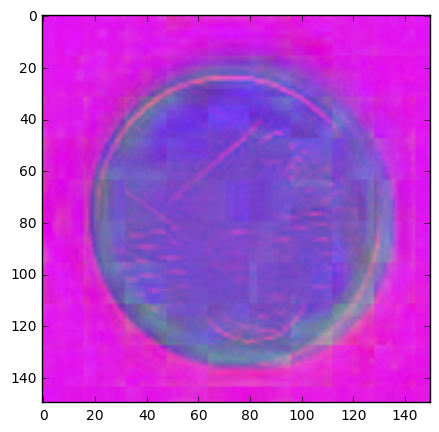

P70216-141256_Candidate_5_150_Brightness_0.jpg
This is 2 cent
(150, 150, 3)


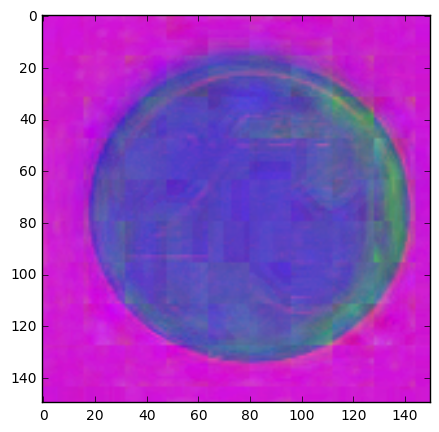

P70216-135435_Candidate_7_150_Brightness_-25.jpg
This is 1 cent
(150, 150, 3)


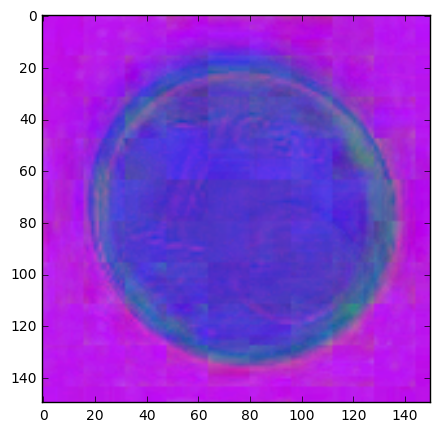

P70216-140815_Candidate_6_150_Brightness_-25.jpg
This is 2 cent
(150, 150, 3)


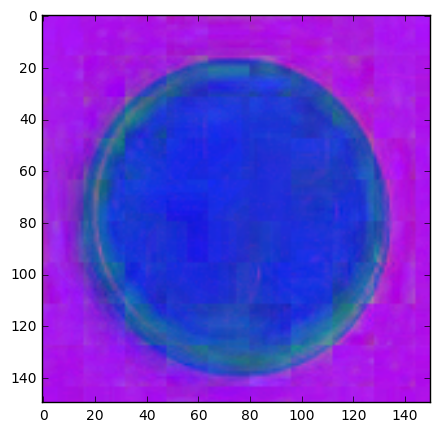

P70210-171834_Candidate_16_150_Brightness_-25.jpg
This is 5 cent
(150, 150, 3)


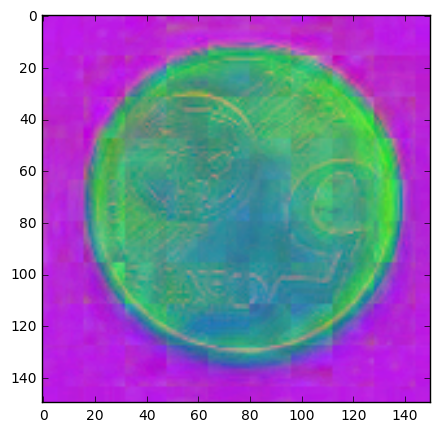

P70216-141654_Candidate_16_150_Brightness_25.jpg
This is 2 cent
(150, 150, 3)


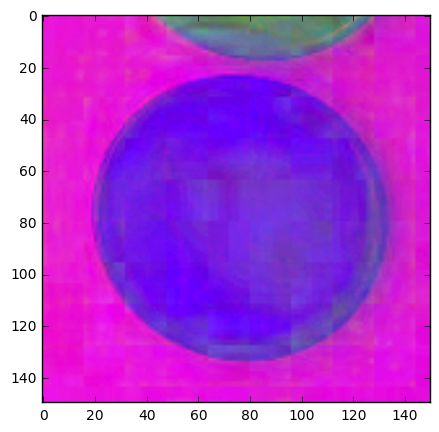

P70216-135531_Candidate_9_150_Brightness_0.jpg
This is 1 cent
(150, 150, 3)


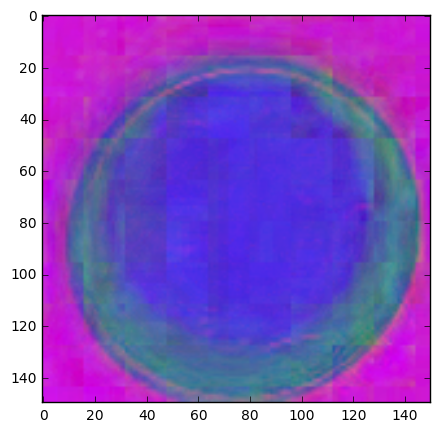

P70216-141021_Candidate_16_150_Brightness_0.jpg
This is 2 cent
(150, 150, 3)


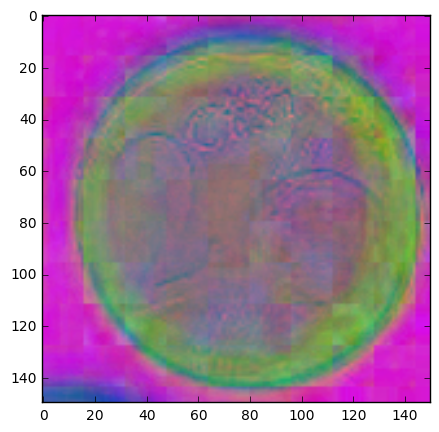

P70216-141115_Candidate_16_150_Brightness_-25.jpg
This is 2 cent
(150, 150, 3)


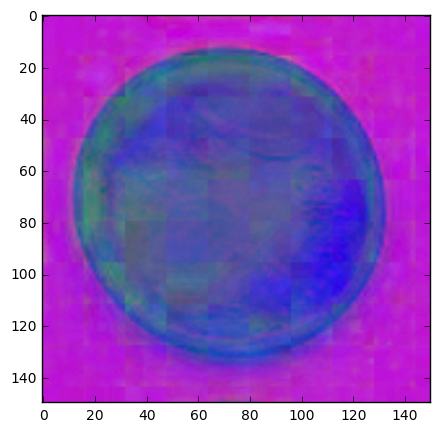

P70210-171950_Candidate_6_150_Brightness_-25.jpg
This is 5 cent
(150, 150, 3)


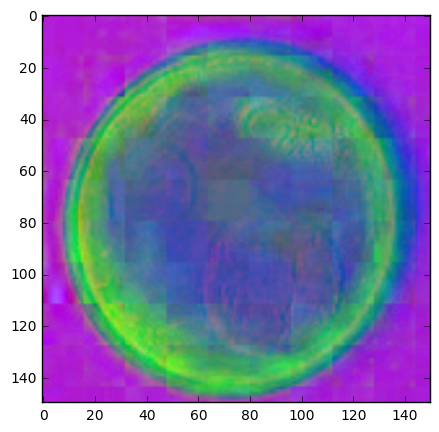

P70216-141424_Candidate_3_150_Brightness_0.jpg
This is 2 cent
(150, 150, 3)


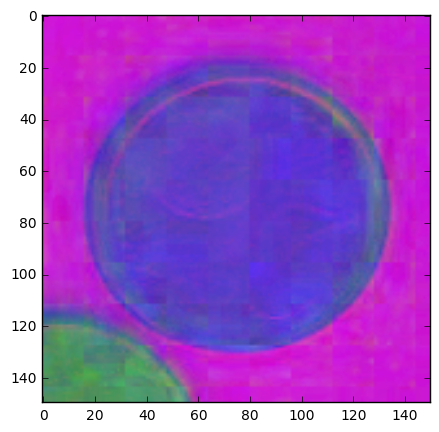

P70216-140840_Candidate_13_150_Brightness_-25.jpg
This is 2 cent
(150, 150, 3)


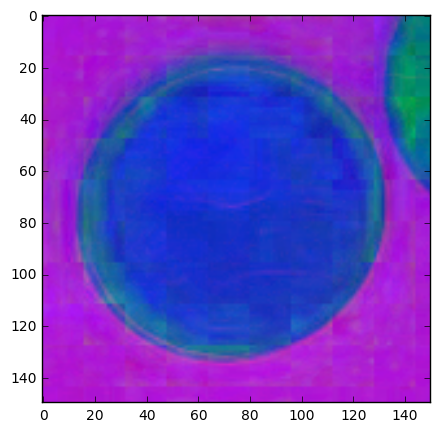

P70216-141638_Candidate_10_150_Brightness_0.jpg
This is 2 cent
(150, 150, 3)


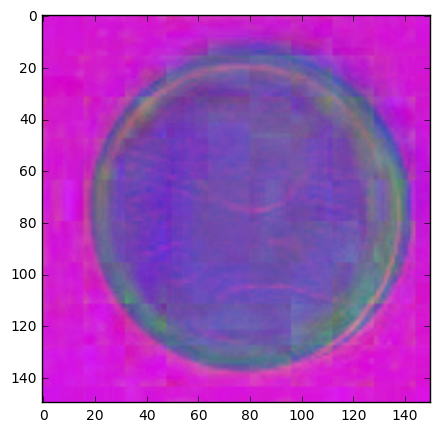

P70216-141424_Candidate_8_150_Brightness_-25.jpg
This is 2 cent
(150, 150, 3)


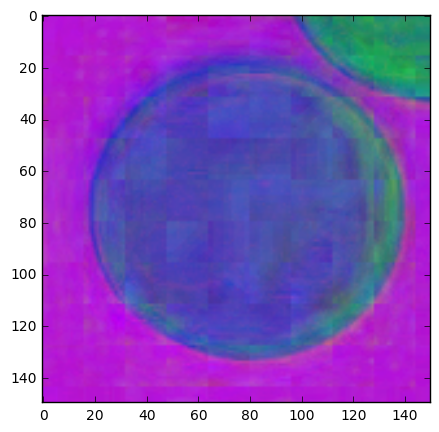

P70216-135514_Candidate_27_150_Brightness_-25.jpg
This is 1 cent
(150, 150, 3)


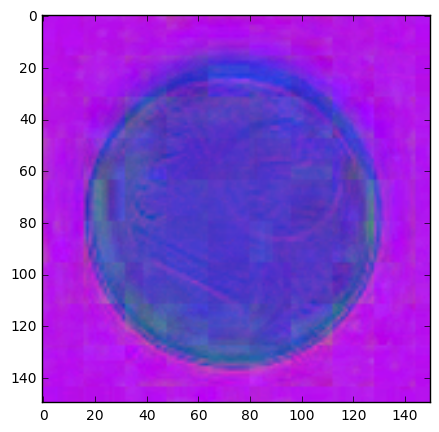

P70216-140928_Candidate_18_150_Brightness_0.jpg
This is 2 cent
(150, 150, 3)


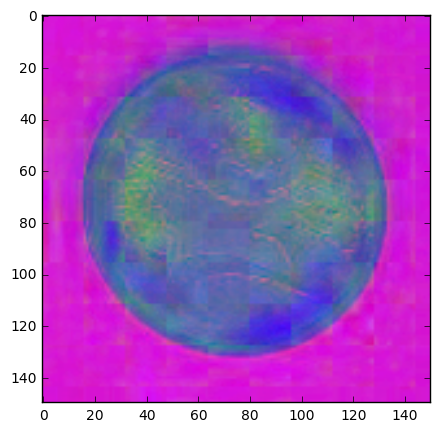

P70216-135837_Candidate_20_150_Brightness_0.jpg
This is 1 cent
(150, 150, 3)


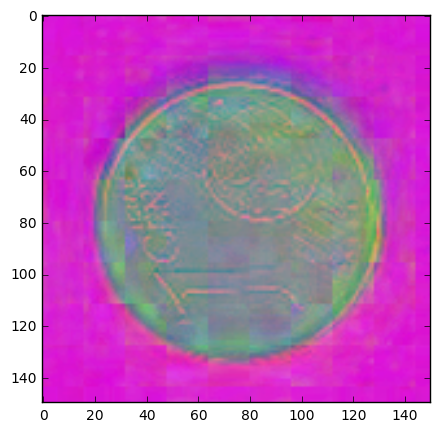

P70216-141709_Candidate_21_150_Brightness_-25.jpg
This is 2 cent
(150, 150, 3)


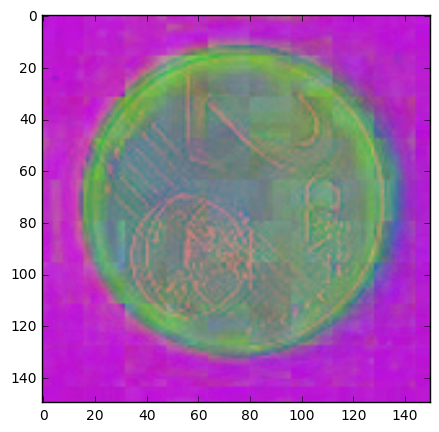

P70216-135915_Candidate_26_150_Brightness_0.jpg
This is 1 cent
(150, 150, 3)


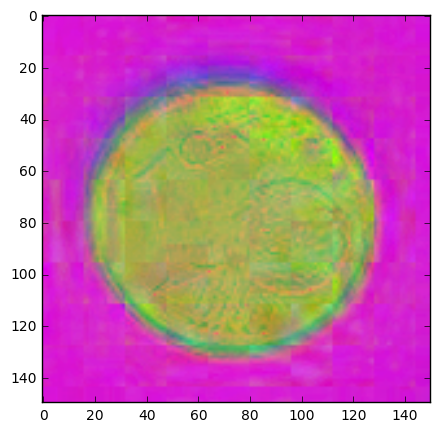

P70216-140137_Candidate_7_150_Brightness_0.jpg
This is 1 cent
(150, 150, 3)


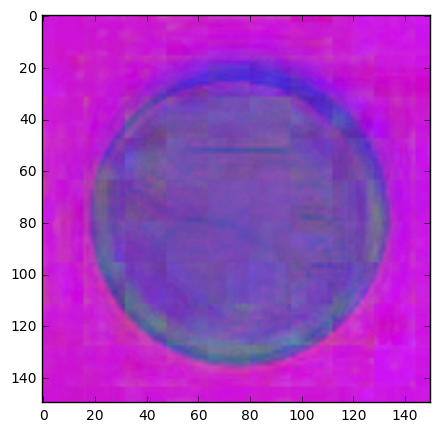

P70210-171950_Candidate_9_150_Brightness_0.jpg
This is 5 cent
(150, 150, 3)


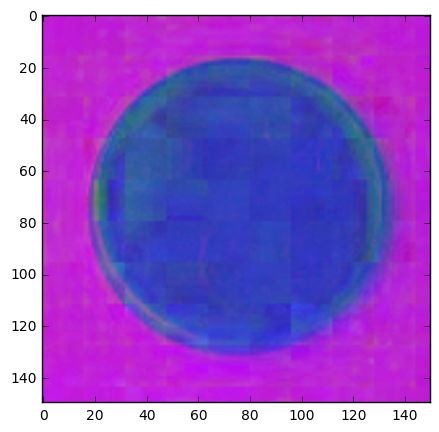

P70210-171627_Candidate_12_150_Brightness_-25.jpg
This is 5 cent
(150, 150, 3)


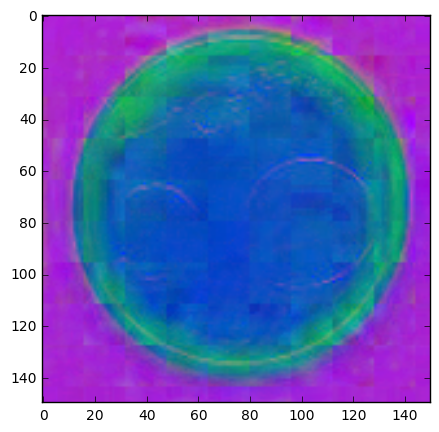

P70216-141128_Candidate_9_150_Brightness_25.jpg
This is 2 cent
(150, 150, 3)


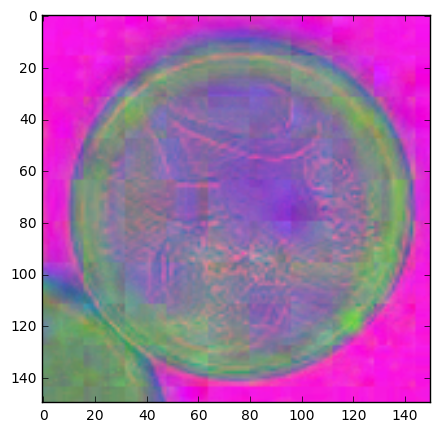

P70216-135626_Candidate_26_150_Brightness_0.jpg
This is 1 cent
(150, 150, 3)


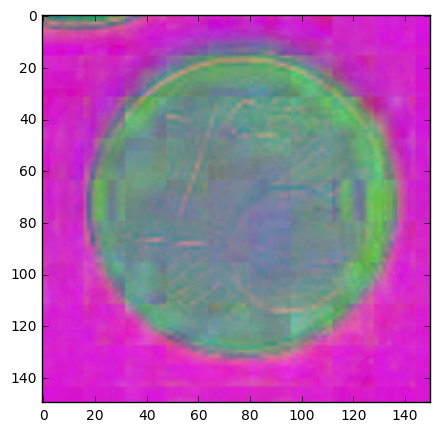

P70216-135855_Candidate_10_150_Brightness_0.jpg
This is 1 cent
(150, 150, 3)


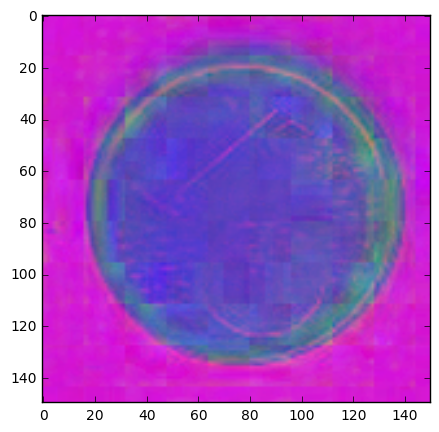

P70210-171021_Candidate_21_150_Brightness_25.jpg
This is 5 cent
(150, 150, 3)


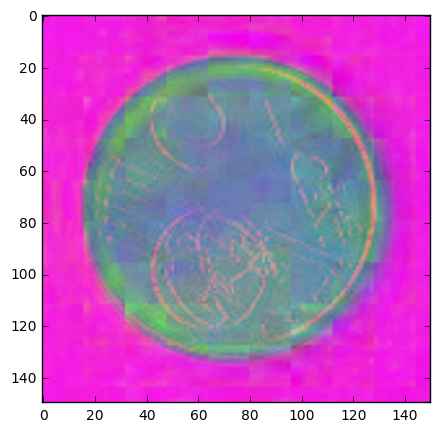

P70216-141008_Candidate_10_150_Brightness_0.jpg
This is 2 cent
(150, 150, 3)


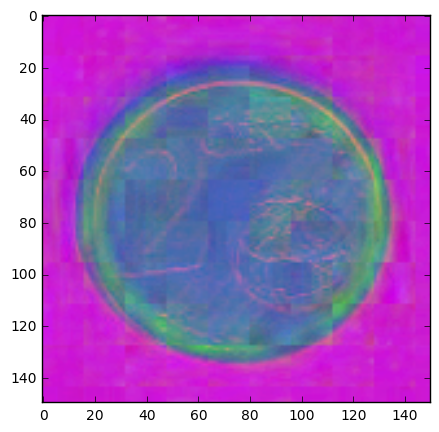

P70216-140928_Candidate_6_150_Brightness_25.jpg
This is 2 cent
(150, 150, 3)


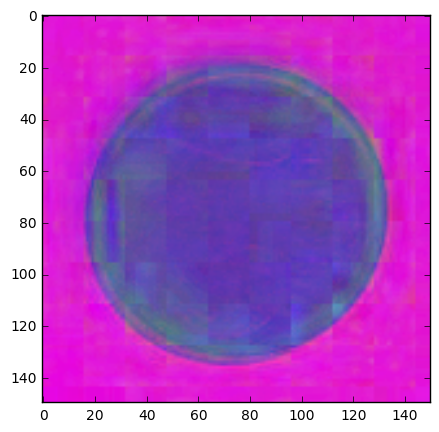

P70216-141439_Candidate_22_150_Brightness_25.jpg
This is 2 cent
(150, 150, 3)


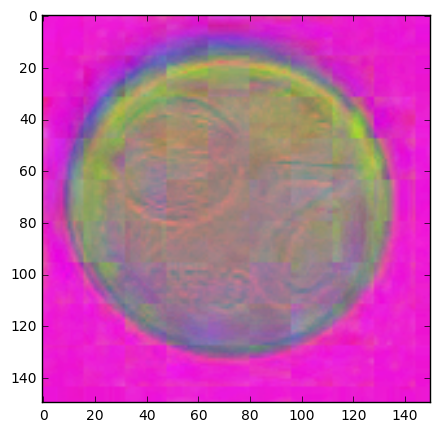

P70216-140857_Candidate_9_150_Brightness_0.jpg
This is 2 cent
(150, 150, 3)


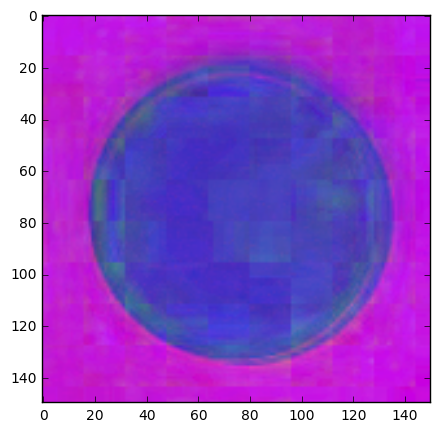

In [3]:
#Print some coins
def printSomeCoints(img, train_images_name, labels, ncoins):
    for i in range(0,ncoins):
        print(train_images_name[i])
        if labels[i] == 0.:
            print("This is 1 cent")
        if labels[i] == 1.:
            print("This is 2 cent")
        if labels[i] == 2.:
            print("This is 5 cent")
        plt.figure(figsize=(10,5))
        print(train[i].shape)
        plt.imshow(train[i])
        plt.show()
    
    
printSomeCoints(train, train_images_name, labels_train_nocategorical, 30)

<html>
<body>
<h2 style = "color:red"> Building the classificator (work in progress..): </h2>
<p> Use the training dataset to build the classificator using a ConvNN.</p>
</body>
</html>

In [4]:
#Loading keras deep learnig libraries to build the model: https://keras.io/ 
from keras.layers import Input, Dense, Flatten, Dropout, Activation, advanced_activations, Convolution2D, MaxPooling2D
from keras.models import Model, model_from_json
from keras.optimizers import RMSprop
from keras.callbacks import ReduceLROnPlateau, EarlyStopping
from keras import initializations

## Standard Architecture

In [5]:
#Model hyperparameters
batch_size = 32 # in each iteration, we consider batch_size training examples at once
num_epochs = 50 # we iterate num_epochs times over the entire training set
kernel_size = 3 # we will use 3x3 kernels throughout
pool_size = 2 # we will use 2x2 pooling throughout
conv_depth_1 = 32 # we will initially have 32 kernels per conv. layer...
conv_depth_2 = 62 # ...switching to 64 after the first pooling layer
conv_depth_3 = 128 # ...switching to 64 after the first pooling layer
conv_depth_4 = 256 # ...switching to 64 after the first pooling layer
conv_depth_5 = 512 # ...switching to 64 after the first pooling layer
drop_prob_1 = 0.25 # dropout after pooling with this probability 
drop_prob_2 = 0.5 # dropout in the FC layer with this probability 
hidden_size = 32 # the FC layer will this neurons
data_augmentation = False # Whether to use or not data augmentation

NN = False
ConvNN = True
if ConvNN == True:
    #Architecture
    inp = Input(shape=(ROWS, COLS, CHANNELS)) # N.B. depth goes first in Keras!
    conv_1 = Convolution2D(conv_depth_1, kernel_size, kernel_size, border_mode='same', activation='relu')(inp)
    pool_1 = MaxPooling2D(pool_size=(pool_size, pool_size))(conv_1)
    conv_2 = Convolution2D(conv_depth_2, kernel_size, kernel_size, border_mode='same', activation='relu')(pool_1)
    pool_2 = MaxPooling2D(pool_size=(pool_size, pool_size))(conv_2)
    conv_3 = Convolution2D(conv_depth_3, kernel_size, kernel_size, border_mode='same', activation='relu')(pool_2)
    pool_3 = MaxPooling2D(pool_size=(pool_size, pool_size))(conv_3)
    conv_4 = Convolution2D(conv_depth_4, kernel_size, kernel_size, border_mode='same', activation='relu')(pool_3)
    pool_4 = MaxPooling2D(pool_size=(pool_size, pool_size))(conv_4)
    conv_5 = Convolution2D(conv_depth_5, kernel_size, kernel_size, border_mode='same', activation='relu')(pool_4)
                       

    flat = Flatten()(conv_5)
    hidden = Dense(hidden_size, activation='sigmoid')(flat)
    out = Dense(nb_classes, activation='sigmoid')(hidden)
    model = Model(input=inp, output=out) # To define a model, just specify its input and output layers

if NN == True:
    #Architecture
    inp = Input(shape=(ROWS, COLS, CHANNELS)) # N.B. depth goes first in Keras!                  
    flat = Flatten()(inp)
    hidden = Dense(hidden_size, activation='tanh')(flat)
    out = Dense(nb_classes, activation='sigmoid')(hidden)
    model = Model(input=inp, output=out) # To define a model, just specify its input and output layers

    
#print the summary of the architecture
model.summary()

#Visulize the model if desired
#from keras.utils.visualize_util import plot
#plot(model, to_file='Example_of_CNN_CatsVsDogs.pdf')

# reduce the learning rate by factor of 0.5 if the validation loss does not get lower in 7 epochs
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=0.0000001, verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=3, verbose=1, mode='auto')


# Let's train the model using SGD
#model.compile(loss='categorical_crossentropy', optimizer='sgd', metrics=['accuracy'])
#model.compile(loss='categorical_crossentropy', optimizer='adagrad', metrics=['accuracy'])
model.compile(loss='categorical_crossentropy', optimizer=RMSprop(lr=1e-4), metrics=['accuracy'])

# Let's train the SGD model WITHOUT using data augmentation
if not data_augmentation:
    print('Not using data augmentation.')
    history = model.fit(train, labels_train, batch_size=batch_size, nb_epoch=num_epochs, validation_data=(validation, labels_validation), shuffle=True, callbacks=[reduce_lr,early_stopping])
    
 


____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
input_1 (InputLayer)             (None, 150, 150, 3)   0                                            
____________________________________________________________________________________________________
convolution2d_1 (Convolution2D)  (None, 150, 150, 32)  896         input_1[0][0]                    
____________________________________________________________________________________________________
maxpooling2d_1 (MaxPooling2D)    (None, 75, 75, 32)    0           convolution2d_1[0][0]            
____________________________________________________________________________________________________
convolution2d_2 (Convolution2D)  (None, 75, 75, 62)    17918       maxpooling2d_1[0][0]             
___________________________________________________________________________________________

## Reduced and Deeper Architecture

In [ ]:
#Model hyperparameters
batch_size = 32 # in each iteration, we consider batch_size training examples at once
num_epochs = 40 # we iterate num_epochs times over the entire training set
kernel_size = 3 # we will use 3x3 kernels throughout
pool_size = 2 # we will use 2x2 pooling throughout
conv_depth_1 = 32 # we will initially have 32 kernels per conv. layer...
conv_depth_2 = 62 # ...switching to 64 after the first pooling layer
conv_depth_3 = 128 # ...switching to 64 after the first pooling layer
conv_depth_4 = 256 # ...switching to 64 after the first pooling layer
conv_depth_5 = 512 # ...switching to 64 after the first pooling layer
drop_prob_1 = 0.5 # dropout after pooling with this probability 
drop_prob_2 = 0.5 # dropout in the FC layer with this probability 
hidden_size = 24 # the FC layer will this neurons
data_augmentation = False # Whether to use or not data augmentation

NN = False
ConvNN = True
if ConvNN == True:
    #Architecture
    inp = Input(shape=(ROWS, COLS, CHANNELS)) # N.B. depth goes first in Keras!
    conv_1 = Convolution2D(conv_depth_1, kernel_size, kernel_size, border_mode='same', activation='tanh')(inp)
    pool_1 = MaxPooling2D(pool_size=(pool_size, pool_size))(conv_1)
    conv_2 = Convolution2D(conv_depth_2, kernel_size, kernel_size, border_mode='same', activation='tanh')(pool_1)
    pool_2 = MaxPooling2D(pool_size=(pool_size, pool_size))(conv_2)
    conv_3 = Convolution2D(conv_depth_3, kernel_size, kernel_size, border_mode='same', activation='tanh')(pool_2)
    pool_3 = MaxPooling2D(pool_size=(pool_size, pool_size))(conv_3)
    conv_4 = Convolution2D(conv_depth_4, kernel_size, kernel_size, border_mode='same', activation='tanh')(pool_3)
    pool_4 = MaxPooling2D(pool_size=(pool_size, pool_size))(conv_4)
    conv_5 = Convolution2D(conv_depth_5, kernel_size, kernel_size, border_mode='same', activation='tanh')(pool_4)
                       

    flat = Flatten()(conv_5)
    hidden = Dense(hidden_size, activation='tanh')(flat)
    hidden_d = Dropout(drop_prob_2)(hidden)
    out = Dense(nb_classes, activation='sigmoid')(hidden_d)
    model = Model(input=inp, output=out) # To define a model, just specify its input and output layers

if NN == True:
    #Architecture
    inp = Input(shape=(ROWS, COLS, CHANNELS)) # N.B. depth goes first in Keras!                  
    flat = Flatten()(inp)
    hidden = Dense(hidden_size, activation='tanh')(flat)
    out = Dense(nb_classes, activation='sigmoid')(hidden)
    model = Model(input=inp, output=out) # To define a model, just specify its input and output layers

    
#print the summary of the architecture
model.summary()

#Visulize the model if desired
#from keras.utils.visualize_util import plot
#plot(model, to_file='Example_of_CNN_CatsVsDogs.pdf')

# reduce the learning rate by factor of 0.5 if the validation loss does not get lower in 7 epochs
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=0.0000001, verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=3, verbose=1, mode='auto')


# Let's train the model using SGD
#model.compile(loss='categorical_crossentropy', optimizer='sgd', metrics=['accuracy'])
#model.compile(loss='categorical_crossentropy', optimizer='adagrad', metrics=['accuracy'])
model.compile(loss='categorical_crossentropy', optimizer=RMSprop(lr=1e-4), metrics=['accuracy'])

# Let's train the SGD model WITHOUT using data augmentation
if not data_augmentation:
    print('Not using data augmentation.')
    history = model.fit(train, labels_train, batch_size=batch_size, nb_epoch=num_epochs, validation_data=(validation, labels_validation), shuffle=True, callbacks=[reduce_lr,early_stopping])
                   
                       

# Learning curves (check the performance)

dict_keys(['val_acc', 'acc', 'val_loss', 'lr', 'loss'])


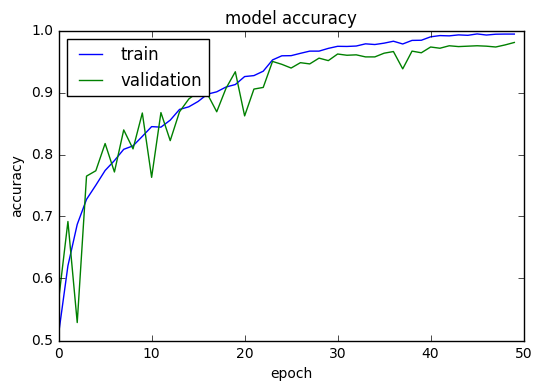

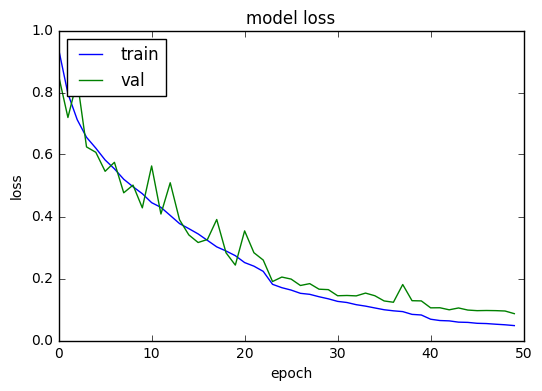

In [6]:
# list all data in history
print(history.history.keys())

# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()
plt.savefig('Accuracy_Example_Coin_Classifier_SmallCoins.pdf')
plt.close()


# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()
plt.savefig('Loss_Example_Coin_Classifier_SmallCoins.pdf')
plt.close()

# Save 

In [7]:
#SaveModel(model, "Model_Example_Coin_Classifier_SmallCoins") #For standard architecture
#SaveModel(model, "Model_Example_Coin_Classifier_SmallCoins_Reduced") #For reduced architecture
SaveModel(model, "Model_Example_Coin_Classifier_SmallCoins_150_norm_relu_yuv") #For the reduced deeper architecture

Saved model Model_Example_Coin_Classifier_SmallCoins_150_norm_relu_yuv to disk


0

# Load and Test model

Loaded model Model_Example_Coin_Classifier_SmallCoins_150_norm_relu_yuv from disk 

PREDICTIONS 

 0.64324903 of 1 cent 

 0.01927478 of 2 cent 

 0.00106051 of 5 cent 



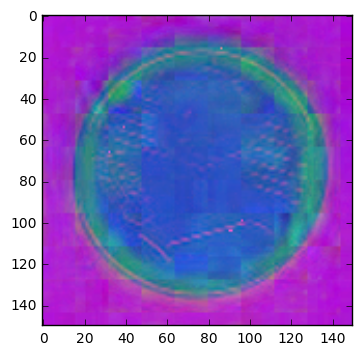

 0.00145405 of 1 cent 

 0.00636118 of 2 cent 

 0.65317774 of 5 cent 



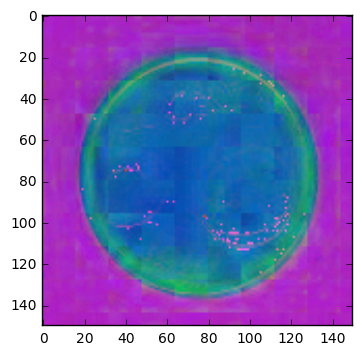

 0.00877445 of 1 cent 

 0.36480993 of 2 cent 

 0.00596518 of 5 cent 



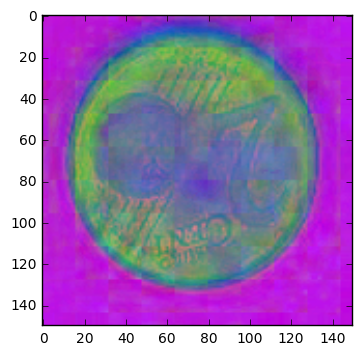

 0.00140913 of 1 cent 

 0.00658261 of 2 cent 

 0.65488201 of 5 cent 



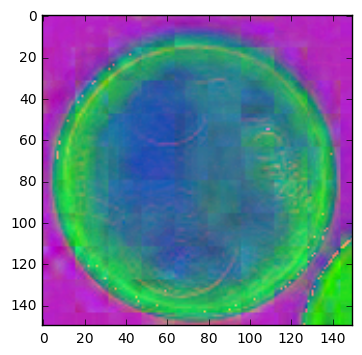

 0.45090529 of 1 cent 

 0.02688236 of 2 cent 

 0.00137299 of 5 cent 



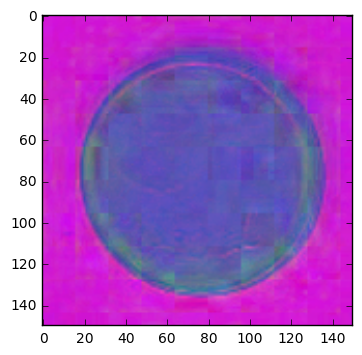

 0.00140795 of 1 cent 

 0.00658025 of 2 cent 

 0.65673405 of 5 cent 



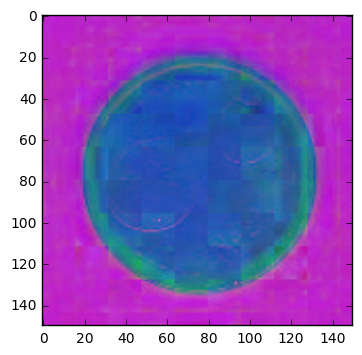

 0.62864119 of 1 cent 

 0.02013179 of 2 cent 

 0.00108393 of 5 cent 



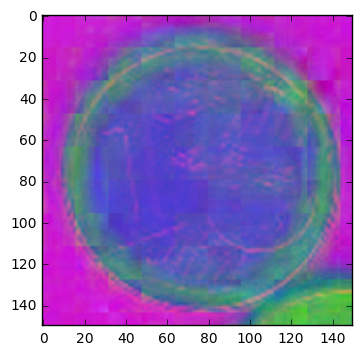

 0.64011216 of 1 cent 

 0.01932217 of 2 cent 

 0.00107089 of 5 cent 



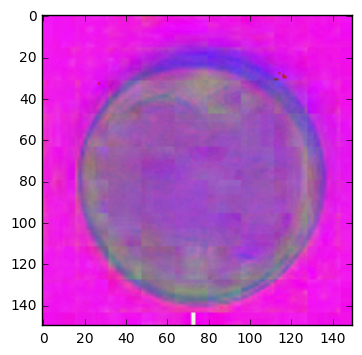

 0.13045259 of 1 cent 

 0.12845542 of 2 cent 

 0.00179606 of 5 cent 



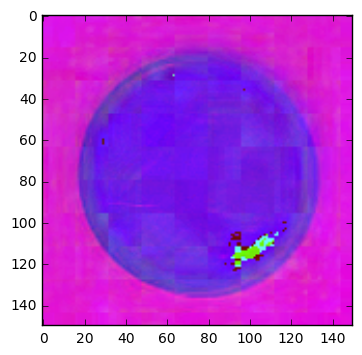

 0.00866384 of 1 cent 

 0.39632422 of 2 cent 

 0.00573618 of 5 cent 



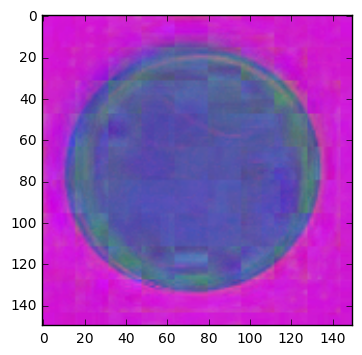

In [8]:
#Useful to test.
LoadAndTest = True
nTest = 10
if LoadAndTest == True:
    #loaded_model=LoadModel("Model_Example_Coin_Classifier_SmallCoins") #For standard architecture
    loaded_model=LoadModel("Model_Example_Coin_Classifier_SmallCoins_150_norm_relu_yuv") #For standard architecture
    # evaluate loaded model on test data
    loaded_model.compile(loss='categorical_crossentropy', optimizer=RMSprop(lr=1e-4), metrics=['accuracy'])
    
    #score_train = loaded_model.evaluate(train, labels_train, verbose=0)
    #score_validation = loaded_model.evaluate(validation, labels_validation, verbose=0)
    #print "Training %s: %.2f%%" % (loaded_model.metrics_names[1], score_train[1]*100)
    #print "Validation %s: %.2f%%" % (loaded_model.metrics_names[1], score_validation[1]*100)    
    
    print("PREDICTIONS \n")
    reduced_test = test[:nTest]
    predictedLabel = loaded_model.predict(reduced_test)

    for i in range(0,nTest):
        print(" %.8f of 1 cent \n" % predictedLabel[i,0])
        print(" %.8f of 2 cent \n" % predictedLabel[i,1])
        print(" %.8f of 5 cent \n" % predictedLabel[i,2])

        plt.imshow(reduced_test[i])
        plt.show()
    
        
    